(224, 224)


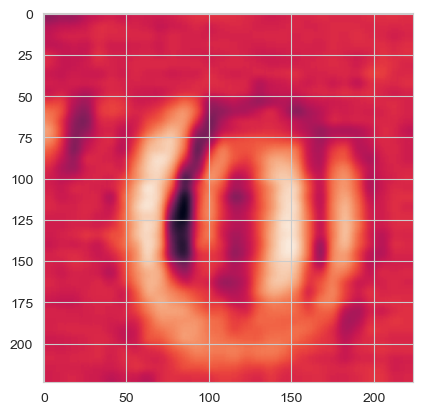

In [1]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import PIL
import cv2
import os
from PIL import Image
img = cv2.imread('./dataset/train/Sample001/img001-00002.png', cv2.IMREAD_GRAYSCALE)
img = Image.fromarray(img)
img = img.resize((224,224))
img = np.array(img)
print(img.shape)
plt.imshow(img)

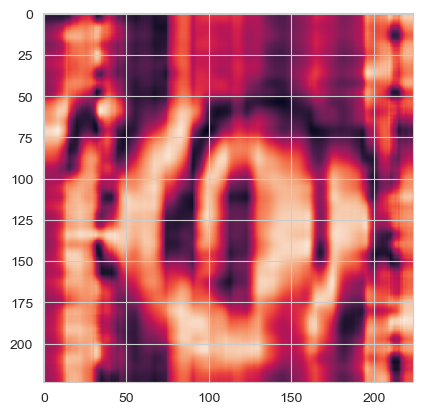

In [2]:
from sklearn.preprocessing import MinMaxScaler

# Standardizing the features
x = MinMaxScaler()
x = x.fit_transform(img)

pca = PCA(n_components=11)
principalComponents: np.ndarray = pca.fit_transform(x)
img_pca: np.ndarray = pca.inverse_transform(principalComponents)
plt.imshow(img_pca)

In [7]:
def choose_best_n_components(df, threshold=0.95):
    """
    Determine the best number of components for PCA based on a given threshold of explained variance.

    :param df: pandas DataFrame, the dataset to perform PCA on.
    :param threshold: float, the threshold of explained variance to reach. Default is 0.95.
    :return: int, the optimal number of components needed to reach the given threshold.
    """
    # Standardizing the data
    scaler = StandardScaler()
    standardized_data = scaler.fit_transform(df.select_dtypes(include=[np.number]))

    # Applying PCA without specifying the number of components to compute them all
    pca = PCA()
    pca.fit(standardized_data)

    # Calculating the cumulative explained variance
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

    # Finding the number of components to reach the threshold
    # n_components = np.where(cumulative_variance >= threshold)[0][0] + 1
    n_components = 56
    
    # Get cumulative variance explained by n_components
    cumulative_variance_explained = cumulative_variance[n_components - 1]
    # Plotting the cumulative explained variance
    plt.figure(figsize=(10, 6))
    plt.plot(cumulative_variance, marker='o')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('PCA Explained Variance')
    plt.axhline(y=cumulative_variance_explained, color='r', linestyle='--')
    plt.axvline(x=n_components, color='r', linestyle='--')
    plt.show()

    return n_components

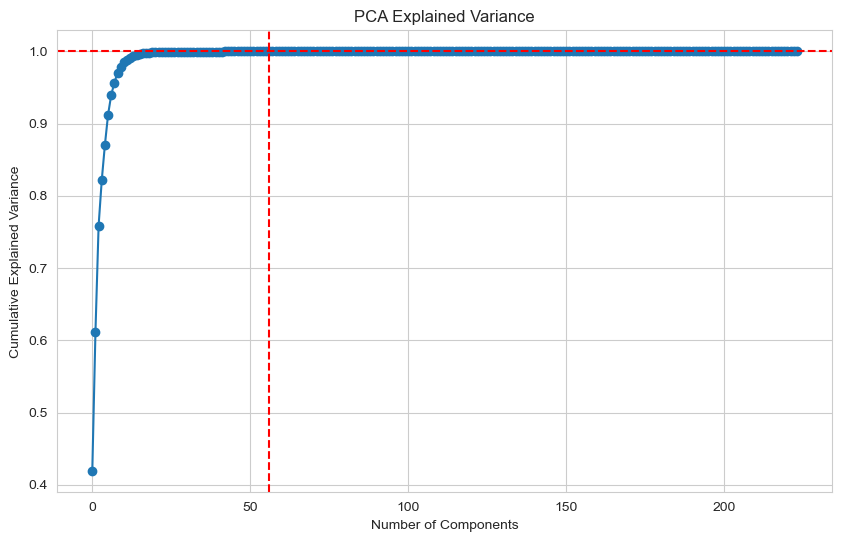

In [8]:
best_n = choose_best_n_components(pd.DataFrame(img), threshold=0.95)
# print('Best number of components:', best_n)

# pca = PCA(n_components=56)
# 
# # Plot first best_n components
# pca_all = pca.fit(img)
# pca_components = pca.transform(img)
# pca_approx = pca.inverse_transform(pca_components)
# pca_approx = pca_approx.reshape((224,224))

In [17]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename), cv2.IMREAD_GRAYSCALE)
        img = Image.fromarray(img)
        img = img.resize((224,224))
        img = np.array(img)
        if img is not None:
            images.append(img)
    return images

train = load_images_from_folder('./dataset/train/Sample001')
train = np.array(train)
train.shape

(71, 224, 224)

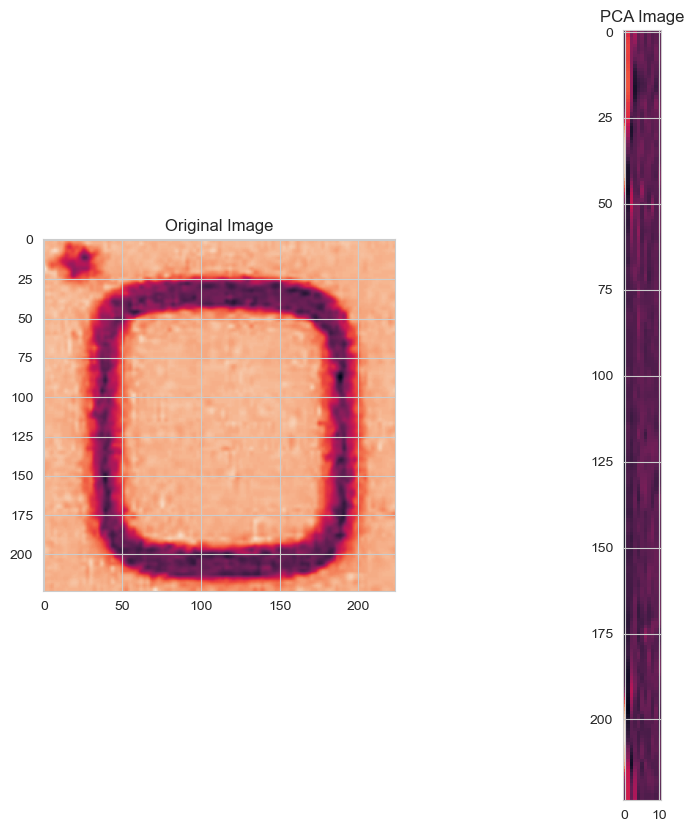

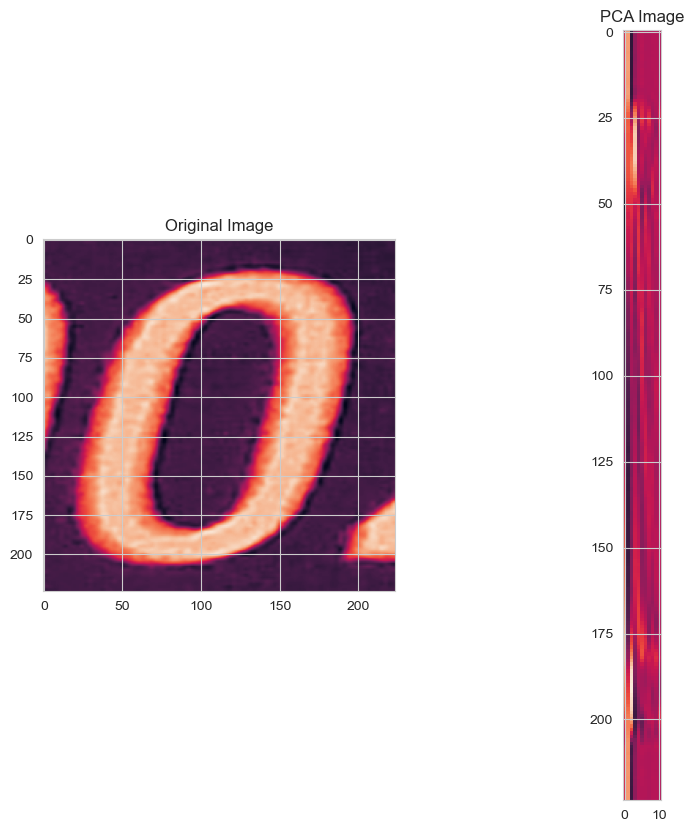

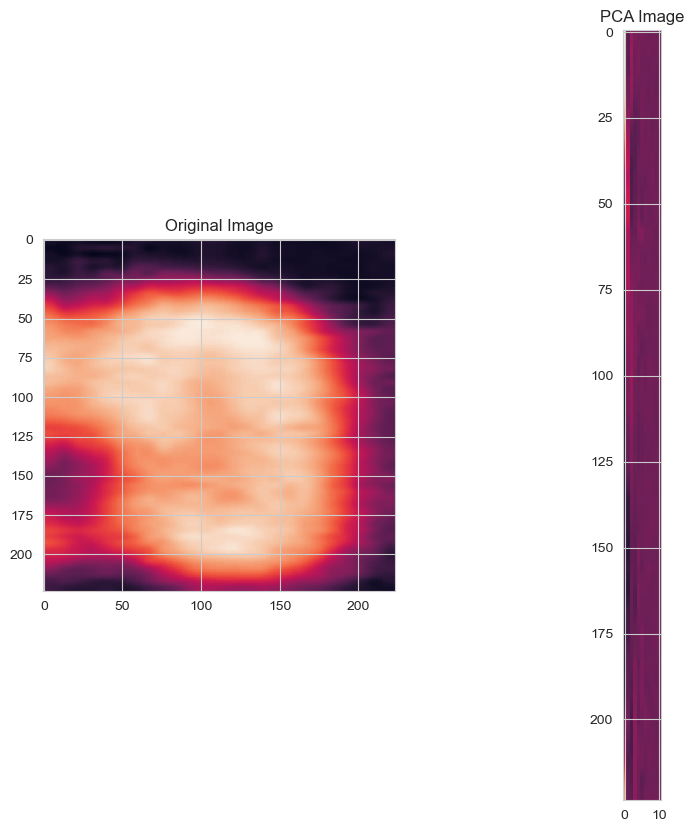

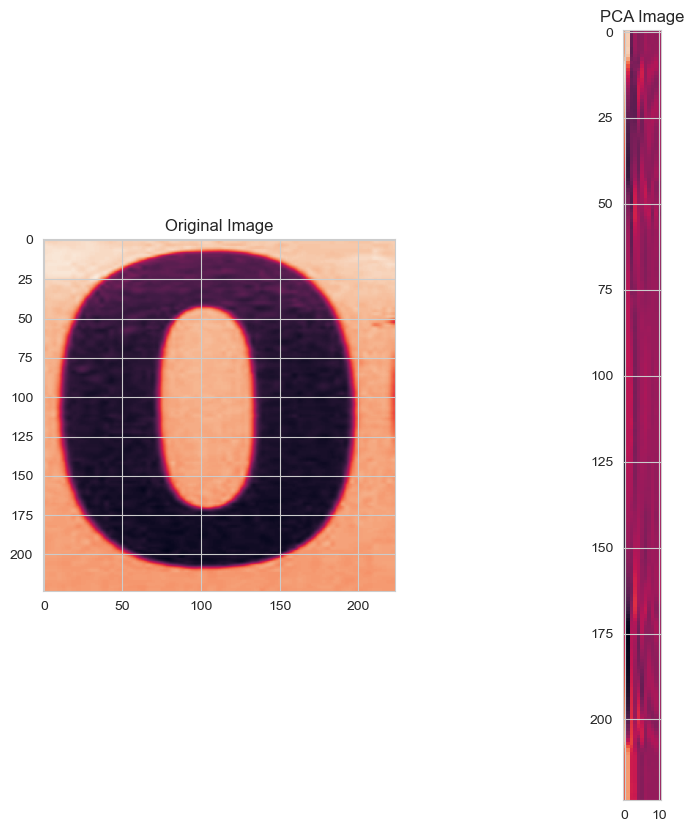

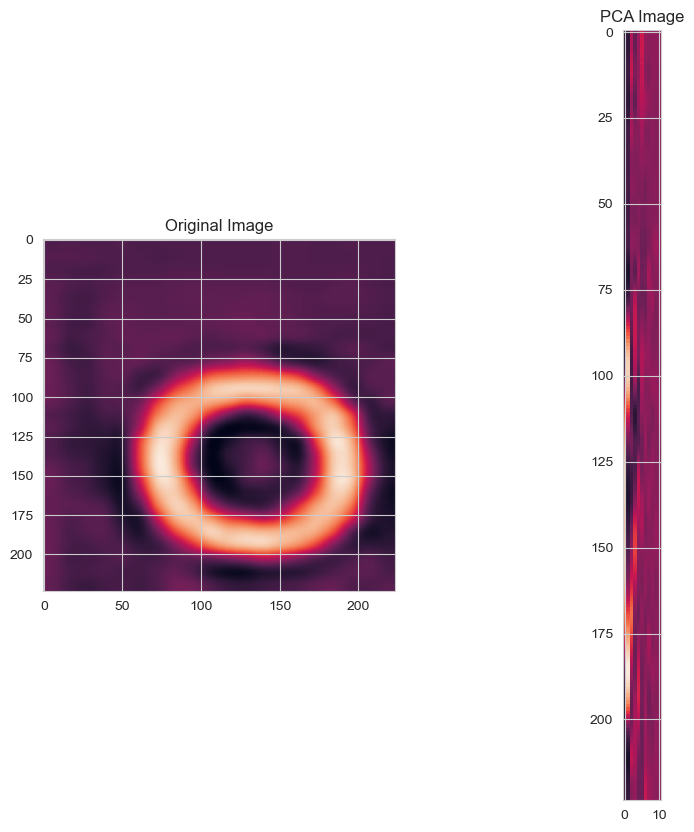

...

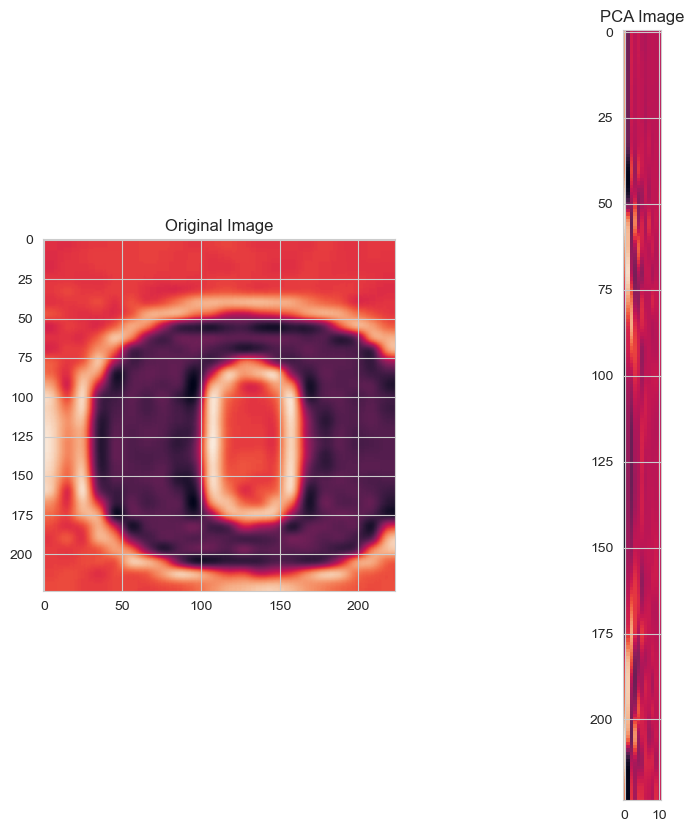

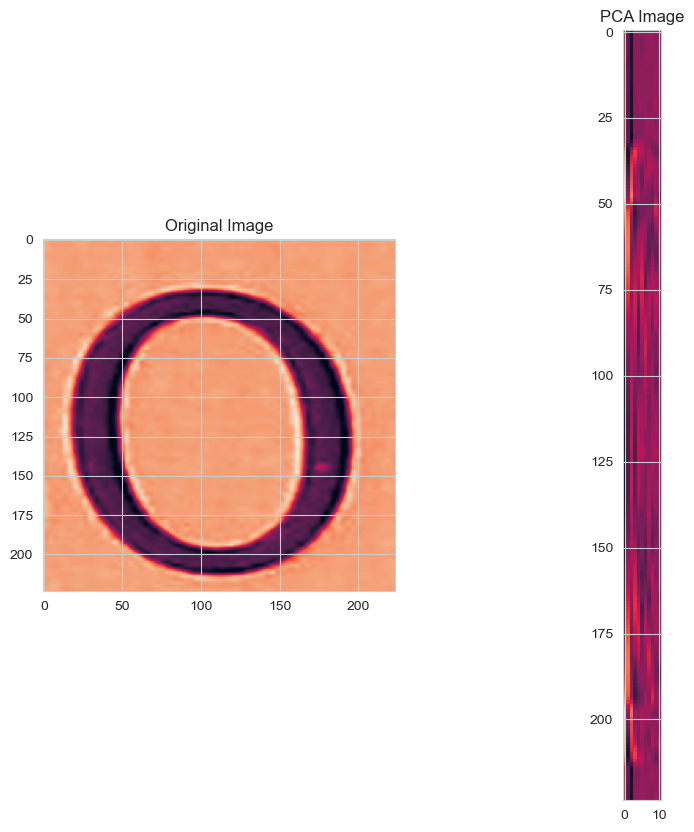

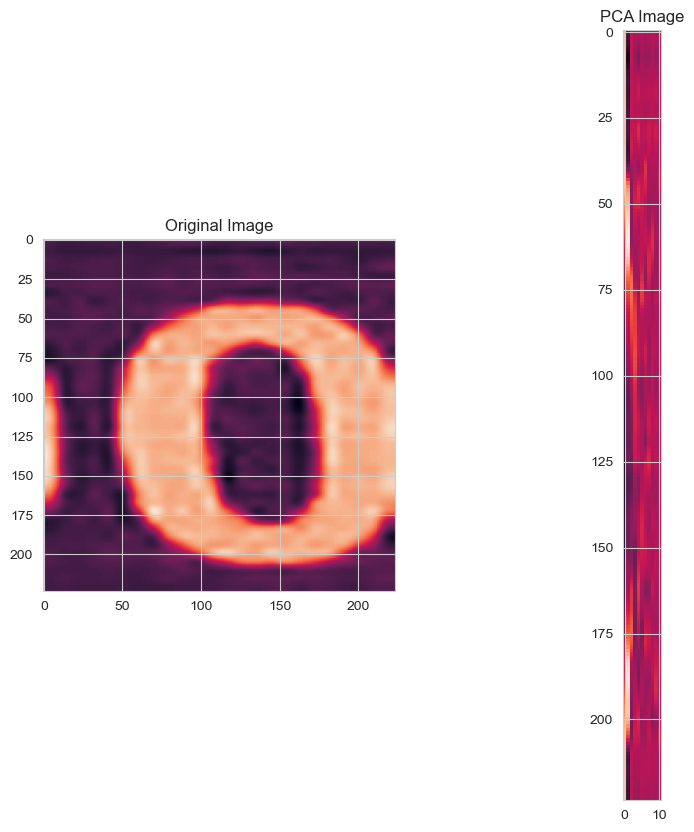

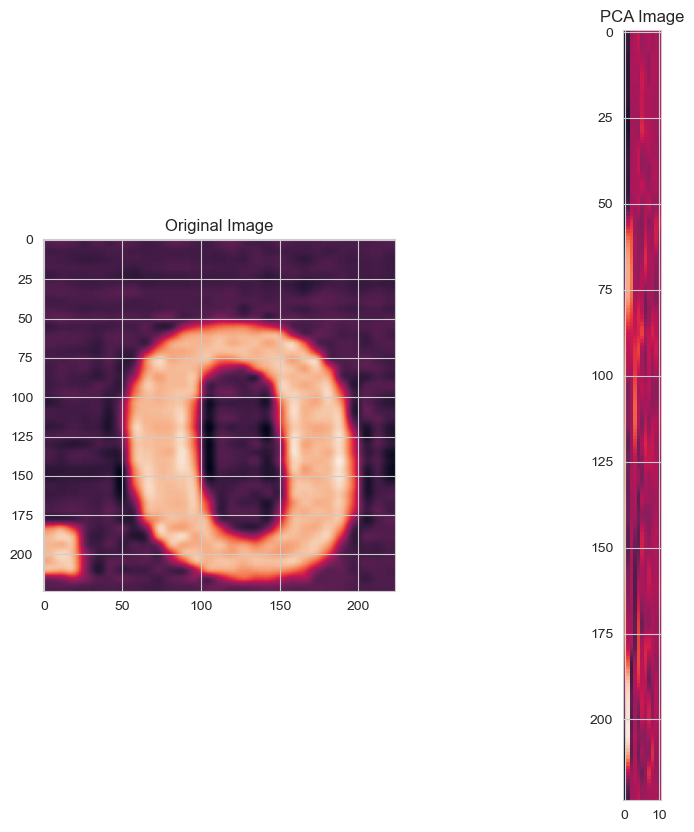

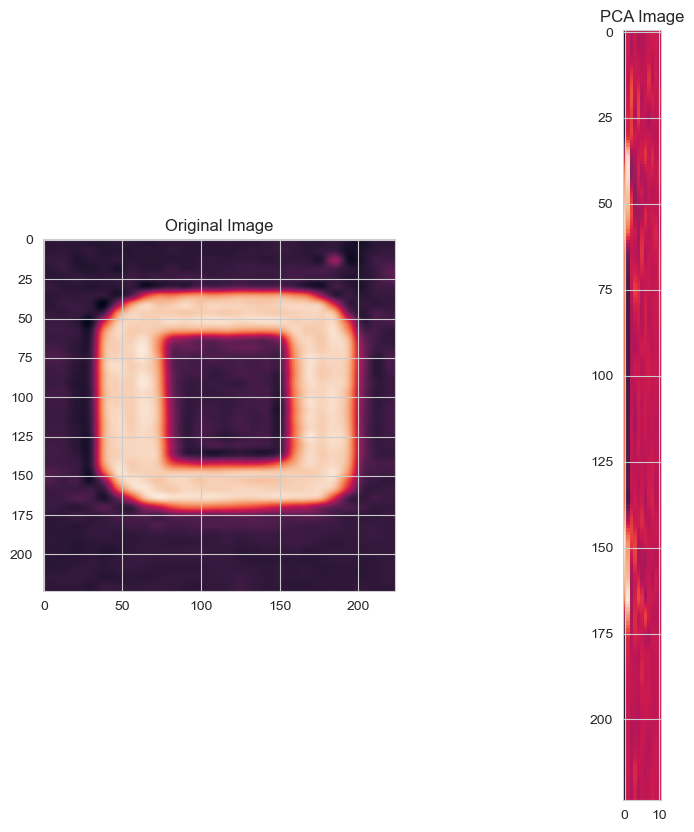

In [45]:
n_components = 11
for image in train:
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.subplot(1, 2, 2)

    scale = MinMaxScaler()
    image = scale.fit_transform(image)
    pca = PCA(n_components=n_components)
    pca_all = pca.fit(image)
    pca_components = pca.transform(image)
    pca_approx = pca.inverse_transform(pca_components)
    # pca_approx = pca_approx.reshape((224,-1))
    plt.imshow(pca_components)
    plt.title('PCA Image')
    plt.show()
    